In [1]:
!nvidia-smi

Thu Dec  3 01:40:31 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 455.45.01    CUDA Version: 11.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 3080    On   | 00000000:0A:00.0  On |                  N/A |
|  0%   41C    P0    36W / 320W |    230MiB / 10009MiB |    100%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display

import tensorflow as tf
from tensorflow.data.experimental import AUTOTUNE
from tensorflow.keras import Sequential, Model
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, \
Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D

In [3]:
# Use limit gpu memory growth parameter by putting following snippet 
# on top of your code.
# For more info, please refer to the following page.
#   https://www.tensorflow.org/guide/gpu#limiting_gpu_memory_growth
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

In [4]:
_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'
path_to_zip = tf.keras.utils.get_file(fname="facades.tar.gz",
                                      origin=_URL,
                                      extract=True)

PATH = os.path.join(os.path.dirname(path_to_zip), "facades/")
PATH

'/home/masao/.keras/datasets/facades/'

In [5]:
NUM_TRAIN = 400
BATCH_SIZE = 1
WIDTH = 256
HEIGHT = 256
OUTPUT_CHANNELS = 3
LAMBDA = 100

In [6]:
def load_img(img_file):
  img = tf.io.read_file(img_file)
  img = tf.image.decode_jpeg(img)

  w = tf.shape(img)[1]
  w = w // 2
  real_img = img[:, :w, :]
  input_img = img[:, w:, :]

  input_img = tf.cast(input_img, tf.float32)
  real_img = tf.cast(real_img, tf.float32)

  return input_img, real_img

def display_img(inp, real):
  plt.figure()
  plt.imshow(inp / 255.0)
  plt.figure()
  plt.imshow(real / 255.0)

def resize(input_img, real_img, height, width):
  input_img = tf.image.resize(input_img,
                              [height, width],
                              method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_img = tf.image.resize(real_img,
                             [height, width],
                             method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  
  return input_img, real_img

def random_crop(input_img, real_img):
  stacked_imgs = tf.stack([input_img, real_img], axis=0)
  cropped_img = tf.image.random_crop(stacked_imgs,
                                     size=[2, HEIGHT, WIDTH, 3])
  
  return cropped_img[0], cropped_img[1]

# normalize the image to [-1, 1]
def normalize(input_img, real_img):
  input_img = (input_img / 127.5) - 1
  real_img = (real_img / 127.5) - 1

  return input_img, real_img

@tf.function()
def random_jitter(input_img, real_img):
  # resize an image to (286 x 286 x 3)
  input_img, real_img = resize(input_img, real_img, 286, 286)
  # randomly crop an image to (256 x 256 x 3)
  input_img, real_img = random_crop(input_img, real_img)

  if tf.random.uniform(()) > 0.5:
    input_img = tf.image.flip_left_right(input_img)
    real_img = tf.image.flip_left_right(real_img)

  return input_img, real_img

def load_img_train(img_file):
  input_img, real_img = load_img(img_file)
  input_img, real_img = random_jitter(input_img, real_img)
  input_img, real_img = normalize(input_img, real_img)

  return input_img, real_img

def load_img_test(img_file):
  input_img, real_img = load_img(img_file)
  input_img, real_img = resize(input_img, real_img, HEIGHT, WIDTH)
  input_img, real_img = normalize(input_img, real_img)

  return input_img, real_img

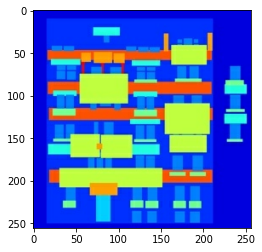

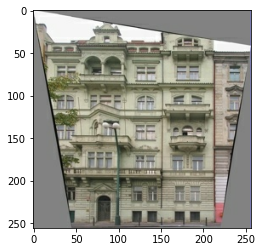

In [7]:
test_img = os.path.join(PATH, "train/100.jpg")
inp, real = load_img(test_img)
display_img(inp, real)

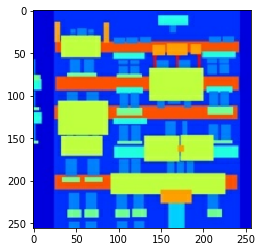

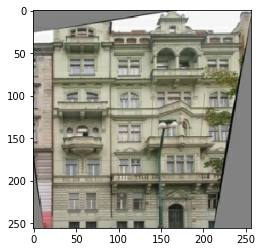

In [8]:
inp, real = load_img(os.path.join(PATH, "train/100.jpg"))
jittered_inp, jittered_real = random_jitter(inp, real)
display_img(jittered_inp, jittered_real)

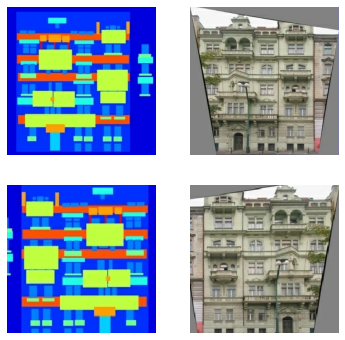

In [9]:
plt.figure(figsize=(6, 6))
for i, img in enumerate([inp, real, jittered_inp, jittered_real]):
  plt.subplot(2, 2, i+1)
  plt.imshow(img / 255.0)
  plt.axis("off")
plt.show()

In [10]:
# define input pipeline
train_dataset = tf.data.Dataset.list_files(os.path.join(PATH, "train/*.jpg"))
train_dataset = train_dataset.map(load_img_train,
                                  num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.shuffle(NUM_TRAIN)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.list_files(os.path.join(PATH, "test/*.jpg"))
test_dataset = test_dataset.map(load_img_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [11]:
# build the generator
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = Sequential()
  result.add(Conv2D(filters, 
                    size,
                    strides=2,
                    padding="same",
                    kernel_initializer=initializer,
                    use_bias=False))
  if apply_batchnorm:
    result.add(BatchNormalization())
  result.add(LeakyReLU())

  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = Sequential()
  result.add(Conv2DTranspose(filters,
                             size,
                             strides=2,
                             padding="same",
                             kernel_initializer=initializer,
                             use_bias=False))
  result.add(BatchNormalization())
  if apply_dropout:
    result.add(Dropout(0.5))

  result.add(ReLU())

  return result

In [12]:
down_model = downsample(512, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print("shape of downsample:", down_result.shape)

up_model = upsample(3, 4)
up_result = up_model(down_result)
print("shape of upsample:", up_result.shape)

shape of downsample: (1, 128, 128, 512)
shape of upsample: (1, 256, 256, 3)


In [13]:
def Generator():
  inputs = Input(shape=[256, 256, 3])
  # () shows the shape after each downsample
  down_stack = [downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
                downsample(128, 4), # (bs, 64, 64, 128)
                downsample(256, 4), # (bs, 32, 32, 256)
                downsample(512, 4), # (bs, 16, 16, 512)
                downsample(512, 4), # (bs, 8, 8, 512)
                downsample(512, 4), # (bs, 4, 4, 512)
                downsample(512, 4), # (bs, 2, 2, 512)
                downsample(512, 4),] # (bs, 1, 1, 512)

  # () shows the shape after each upsample(* 2 shows concatinating with each skip connection)
  up_stack = [upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 512 * 2)
              upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 512 * 2)
              upsample(512, 4), # (bs, 8, 8, 512 * 2)
              upsample(512, 4), # (bs, 16, 16, 512 * 2)
              upsample(256, 4), # (bs, 32, 32, 256 * 2)
              upsample(128, 4), # (bs, 64, 64, 128 * 2)
              upsample(64, 4),] # (bs, 128, 128, 64 * 2)]

  initializer = tf.random_normal_initializer(0, 0.02)
  last = Conv2DTranspose(OUTPUT_CHANNELS,
                         4,
                         strides=2,
                         padding="same",
                         kernel_initializer=initializer,
                         activation="tanh") # (bs, 256, 256, 3)

  x = inputs
  # downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)
  skips = reversed(skips[:-1])

  # upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = Concatenate()([x, skip])
  x = last(x)

  return Model(inputs=inputs, outputs=x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


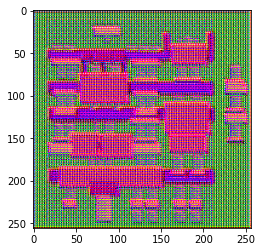

In [14]:
generator = Generator()
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [15]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(disc_generated_output, gen_output, target):
  # As for the generator, it needs to try to decieve the discriminator as real outputs 
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  # MAE
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [16]:
def Discriminator():
  initializer = tf.random_normal_initializer(0, 0.02)

  inp = Input(shape=[256, 256, 3], name="input_image")
  tar = Input(shape=[256, 256, 3], name="target_image")
  # tf.keras.layers.concatenate is used for Functional API
  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, 3 * 2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)
  zero_pad1 = ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = Conv2D(512, 
                4, 
                strides=1,
                kernel_initializer=initializer,
                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
  batchnorm1 = BatchNormalization()(conv)
  leaky_relu = LeakyReLU()(batchnorm1)
  zero_pad2 = ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
  outputs = Conv2D(1, 
                   4, 
                   strides=1,
                   kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  
  return Model(inputs=[inp, tar], outputs=outputs)

shape of disc_out: (1, 30, 30, 1)


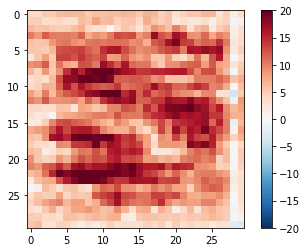

In [17]:
discriminator = Discriminator()
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
print("shape of disc_out:", disc_out.shape)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap="RdBu_r")
plt.colorbar()

In [18]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [19]:
# define the optimizer and checkpoint
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = "./training_checkpoints"
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [20]:
# Note: The training=True is intentional here since we want the batch statistics 
# while running the model on the test dataset. If we use training=False, we will 
# get the accumulated statistics learned from the training dataset (which we don't want)
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ["Input Image", "Ground Truth", "Predicted Image"]

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    # So change value range from [-1, 1] to [0, 1]
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis("off")
  plt.show()

In [21]:
#os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'


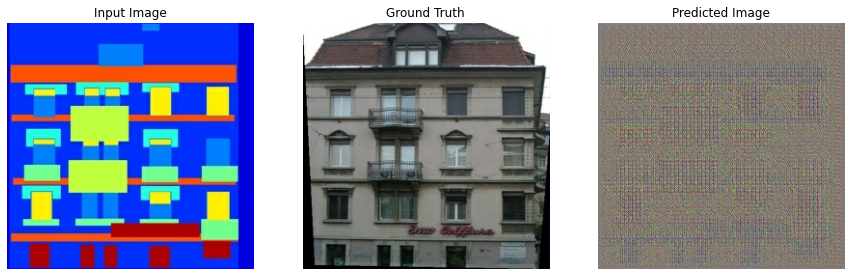

In [22]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [23]:
# training script
EPOCHS = 150
log_dir = "logs/"

summary_writer = tf.summary.create_file_writer(os.path.join(log_dir, 
                                                            "fir",
                                                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S")))

@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, 
                                                               gen_output, 
                                                               target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
  
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
  
  with summary_writer.as_default():
    tf.summary.scalar("gen_total_loss", gen_total_loss, step=epoch)
    tf.summary.scalar("gen_gan_loss", gen_gan_loss, step=epoch)
    tf.summary.scalar("gen_l1_loss", gen_l1_loss, step=epoch)
    tf.summary.scalar("disc_loss", disc_loss, step=epoch)

In [24]:
# define training loop
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch:", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print(".", end="")
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)
    
    print("Time taken for epoch {} is {} sec\n".format(epoch + 1,
                                                       time.time() - start))
    
  checkpoint.save(file_prefix=checkpoint_prefix)

In [25]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

ERROR: Could not find `tensorboard`. Please ensure that your PATH
contains an executable `tensorboard` program, or explicitly specify
the path to a TensorBoard binary by setting the `TENSORBOARD_BINARY`
environment variable.

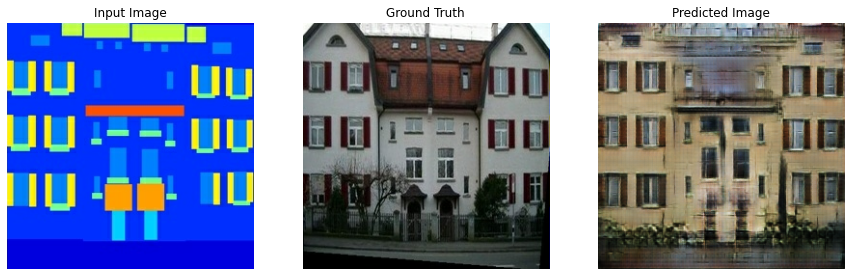

Epoch: 149
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

Time taken for epoch 150 is 13.959444522857666 sec



In [26]:
fit(train_dataset, EPOCHS, test_dataset)

In [27]:
ls {checkpoint_dir}

checkpoint                  ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index                ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index                ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index                ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [28]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

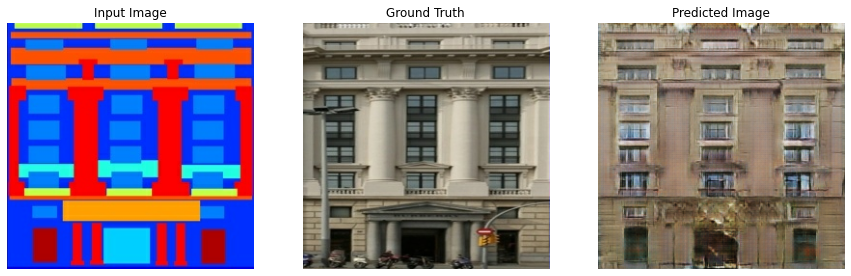

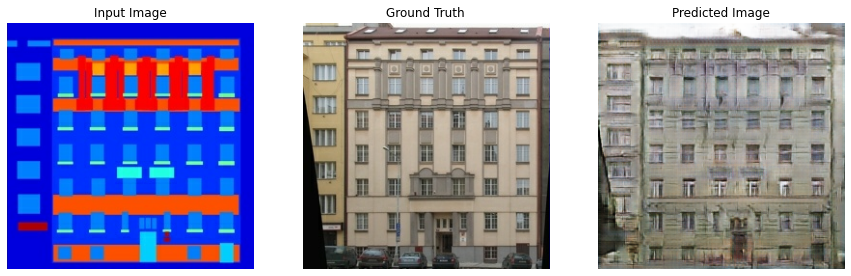

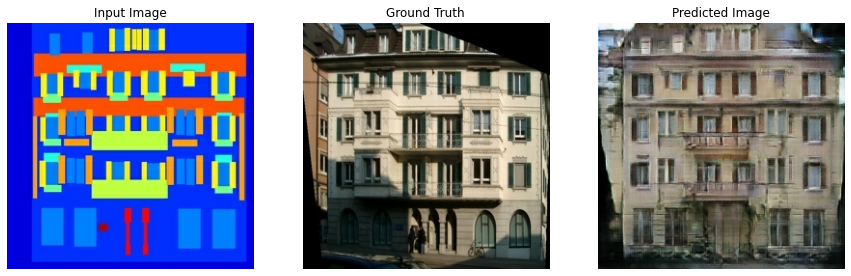

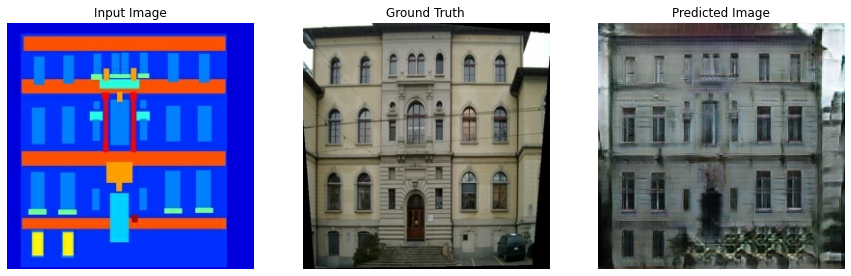

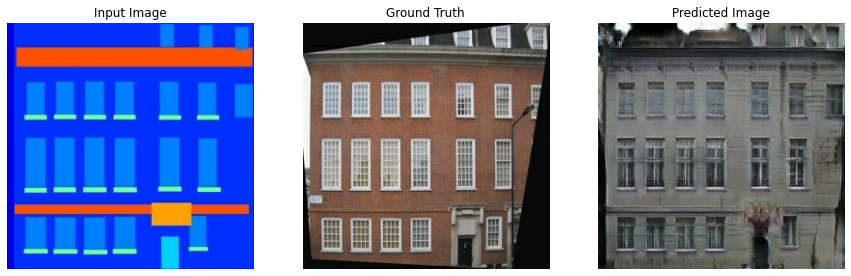

In [29]:
# Run the trained model on a few examples from the test dataset
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)